# THE SHIMMER REVERB EFFECT

In [1]:
%matplotlib inline
import matplotlib
import scipy
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sp
from scipy.io import wavfile
import IPython

In [2]:
plt.rcParams["figure.figsize"] = (20,4)

--------------------
### INTRODUCTION

In this notebook we will explore and implement a basic shimmer reverb effect. This effect has been used by a lot of artists such as Brian Eno, Daniel Lanois, U2, etc... The result of this effect is a very long decay, big reverb effect that can transform a dry guitar sound to an angelic, ambient pad (for example). 

You can check [here](https://youtu.be/KI7by4NOwV0?si=jw2CNXyi32flTsZP) a famous example of this effect used by U2 on the song *"4th of July"*.

There's obviously many ways to get this effect, but the basic fondation of the shimmer is a combination of pitch-shifting, long decay reverb and for most of the time, a feedback loop. 

Too choose a design for our a shimmer, we can take as example the very powerful plugin **ValhallaShimmer** made by ValhallaDSP and try to in a way reverse-engineer the effect : 

<img width="800" style="float: center; margin: 10px 10px 0px 85px;" src="ValhallaShimmerGUI-960x338.jpg">

> *Here we can see the GUI of the effect composed by the different parameters that we can change to control the effect, [here is the list](https://valhalladsp.com/2010/11/27/valhallashimmer-the-controls/) of all the differents controls parameters*

Our chance is that the founder of ValhallaDSP, Sean Costello, offers a variety of posts about the designs of his plugins on the [main page](https://valhalladsp.com/category/learn/plugin-design-learn/) of the company. We have then a lot of insights to help us during the design process. 



#### THE DESIGN 


Of course, considering the constraint of using Python3 and Jupyter notebook to implement this effect. We will need to simplify a lot the fonctionnalities offered by the ValhallaShimmer plugin. Indeed this notebook is more of a Proof-Of-Concept of the basic design for a future, more complex and usuable C implementation of the effect. 

The simplification for this design are : 

1. **We will consider only mono audio signal processing (mono input/mono output)**
2. **We will only use one basic reverb algorithm implementation (no modulation, etc...)** 
3. **We will only use solo pitch-shifting (not dual or reverse, etc...)**

Considering this, we can now build the basic design for a shimmer : A reverb algorithm used with a feedback loop and pitch-shifting.

The final block design for this effect will then be : 
> All the details of this design (the choice of the parameters, the delays, the filters, etc...) will be explained in details after.
> 
<img width="800" style="float: center; margin: 10px 10px 30px 85px;" src="ShimmerReverbDesign_3.png">


> To be able to implement the feedback loop and to help us to create the real-time version of the effect later. All the blocks will need to be implemented as stateful processing blocks. For each block, we will then first implement them as stateless processes (compute the data input as a full array) and then transform them into stateful processes. The final implementation will then, in theory, supports real-time audio processing. Of course, considering the limitation of the Python language, it will not be possible to run real-time tests on this notebook. 

The implementation will then consists of five parts : 

1. Find and build the Pitch-Shifter
2. Build it as a stateful processing block 
3. Find and build the Reverberator
4. Build it as a stateful processing block
5. Implementing low pass and high pass filters
6. Puttting all together using the above design


Now we can set up the audio file we will work with to test the fonctionnalities during this notebook ! 

In [3]:
#32 bit floating point mono WAV file
Fs, s = wavfile.read('VOX.wav')
print('sampling rate is : ' + str(Fs))
IPython.display.Audio(s, rate=Fs)

sampling rate is : 44100


C:\Users\theov\AppData\Local\Temp\ipykernel_15324\3632081674.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fs, s = wavfile.read('VOX.wav')


--------------------
### THE PITCH SHIFTER

The goal here is to find and implement a pitch-shifting technique that is efficient, artistically convincing AND that can work in a real-time process. 

From the website of **ValhallaDSP**, we can find [this blog](https://valhalladsp.wordpress.com/2010/05/04/pitch-shifters-pre-digital/) where Sean Costello talks about his researchs around pitch-shifting techniques for his implementation of the *shimmer* effect. He explains that after trying many digital pitch-shifting techniques, he focused his researchs around digital implementations of analog pitch-shifting hardware as below:  

<img width="300" style="float: center; margin: 0px 10px 30px 350px;" src="hardware_pitch_shift.png">

> *You can see here the blueprint of a machine that use rotating tape-heads to playback an audio tape recording with a different pitch, you can find more information of about those devices in [this article](https://www.aes.org/tmpFiles/elib/20240303/1158.pdf).*


Basically, those machines use the same concept that is implemented digitally with Granular Synthesis pitching techniques.
That's why, starting from the Sean Costello, insight we can choose to implement Granular Synthesis for our pitch-shift block. 

#### Granular Synthesis Pitch Shifting

The idea of Granular Synthesis Pitch shifting as very well explained [here](https://lcav.gitbook.io/dsp-labs/granular-synthesis/effect_description) is to : 
- take our data input $x[n]$ of size $N$
- Choose a grain size $L$
- Take a chunks of $Lf$ samples from the input data, $f$ being the resampling factor (the pitch-shifting factor)
- Resample those samples to get our $L$ size grains chunks
- Use crossfading between those chunks to evict big gaps in gain and avoid clicking
- Generate the output data $y[n]$ of size $N$

By doing this, we are able to pitch-shift the original audio by a factor $f$ without affecting the length of the data


##### 1. First let's implement a function that does resampling using first order interpolation, given the resampling factor

> For example, given $t ; n \le t \le n + 1$ then $y(t) = (1 - t + n)x[n] + (t - n)x[n+1]$

In [4]:
def resample(x, f, N_res) : 
    N = len(x)
    y = np.zeros(N_res)
    #resample using first order interpolation
    for s in range(0, N_res): 
        t = float(s*f)
        n = int(np.floor(t))
        x1 = x[n] if n < N else 0
        x2 = x[n+1] if n + 1 < N else 0
        y[s] = (1-t+n)*x1 + (t-n)*x2
    return y

##### 2. Now we need to implement crossfading between chunks of samples

Indeed, given a $taper$ percentage, we need to implement a function that smooth to zero the beginning and end of the data : 


In [5]:
def crossfade(taper, size) : 
    #check if the taper is not bigger than 100% or lower than 0% 
    if(taper > 1) : taper = 1
    if(taper < 0) : tper = 0
    taper_size = int(taper/2*size)
    y = np.zeros(size)
    for n in range(0, size) : 
        #if the crossfade need to be active
        if(n < taper_size) : 
            y[n] = (n / taper_size)
        elif(n > size -taper_size) : 
            y[n] = 1-(n%(size-taper_size) / taper_size)
        #if the crossfade doesn't need to be active
        else : 
            y[n] = 1  
    return y

Let's test the crossfading with different taper values : 

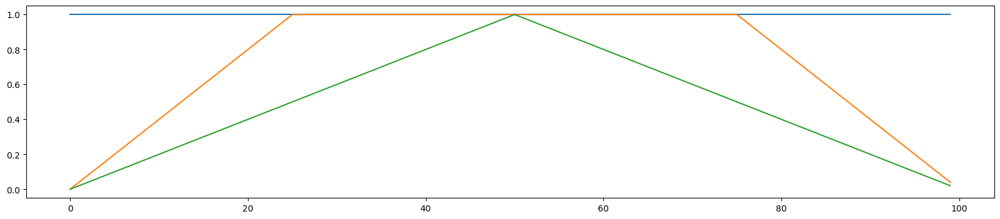

In [6]:
x = np.ones(100) 
x1 = crossfade(0, 100)
x2 = crossfade(.5, 100)
x3 = crossfade(1, 100)
plt.plot(x1)
plt.plot(x2)
plt.plot(x3)

# we can even add a big crossfade in our audio 
IPython.display.Audio(s*crossfade(.3, len(s)), rate=Fs)

The crossfade works, fine ! 

We can now overlap our crossfaded grains when implementing our pitch-shifter

##### 3. We can now implement the final algorithm ! 


>Note : If we want to add overlapping between grains, we need to make jump of $grainSize - grainSize*fade/2$ to perform smooth crossfading


In [7]:
def pitchshifter(x, factor, grain_size, fade) : 
    N = int(len(x))
    y = np.zeros(N)
    input_size = int((grain_size*factor))
    #crossfading window 
    cross = crossfade(fade, grain_size)
    #jump we have to make to correctly overlap our grains
    jump = int((grain_size - grain_size*fade/2)) 
    for n in range(0, N - max(input_size, grain_size), jump) : 
        #compute the grain and add it to the output
        grain = resample(x[n:n+input_size], factor, grain_size)
        #add the computed grain to the output (don't forget crossfade) 
        y[n :n+len(grain)] +=  grain * cross
    return y

Now let's test the pitch shifter !

Let's use grain length of 100ms, shift factor of 1.5 and no crossfading : 

In [8]:
#we can express our grain_size as a time length and get the corresponding number of samples as below
def time_to_samples(time) : return int(np.floor((Fs*time)/1000))

In [9]:
IPython.display.Audio(pitchshifter(s, 1.6, time_to_samples(100), 0), rate=Fs)

We clearly hear the clicking problem...

Now let's test with a fade of 60% : 

In [10]:
IPython.display.Audio(pitchshifter(s, 2, time_to_samples(100), .4), rate=Fs)

Our pitch shifter works well ! 

The frequency shift factor doesn't not mean a lot in terms of musical notes. Something we can do is map our factor to semi-tones shifts. 

The frequency of a note that is $n$ semitones higher (or lower) than a reference frequency $F$ in the well tempered tuning can be computed as : $F_2 = F*2^{n/12}$

In [11]:
#this function compute the frequency shift factor given the semitone shift (in the well tempered tuning) 
def shift_factor(shift) : return np.power(2, (shift/12))

So if we want to lower the pitch by one octave : 

In [16]:
r = pitchshifter(s, shift_factor(-12), time_to_samples(100),.8)

IPython.display.Audio(r, rate=Fs)

We can even use non-linear crossfading to achieve better results 

In [13]:
def cosine_crossfade_window(fade, length):
    fade_length = int(length * fade/2)  # Calculate fade length based on percentage
    window = np.ones(length)  # Initialize with all ones
    fade_window = np.cos(np.linspace(0, np.pi / 2, fade_length)) ** 2 # Cosine fade window
    
    # Apply fade-in
    window[:fade_length] = fade_window[::-1]
    
    # Apply fade-out
    window[-fade_length:] = fade_window
    
    return window

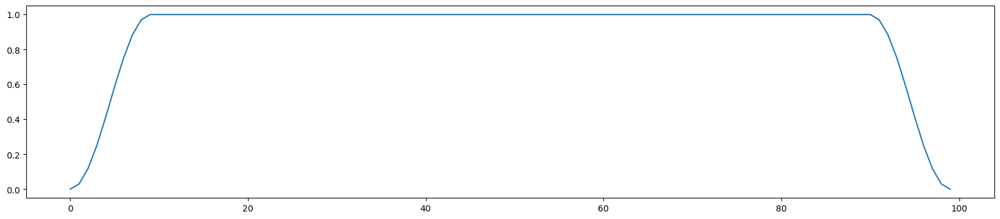

In [14]:
win = cosine_crossfade_window(.2, 100)
plt.plot(win)

##### 4. Stateful block implementation

The following function implement the granular pitch shifter as a stateful block process. It means that it can be called on successive chunks of data and achieve the same results without borders effects. 

In [17]:
#those parameters where found with the above tests and experimentations 
grain_size = time_to_samples(75)
fade = .5

#the stateful block implementation
class GS_pitchshift:
    def __init__(self, shift):
        #the parameters
        self.shift_factor = shift
        self.grain_size = grain_size
        self.input_size = int(self.grain_size*self.shift_factor)
        self.jump = int(self.grain_size - self.grain_size*fade/2) 
        self.overlap = self.grain_size - self.jump 
        
        #tapering window 
        self.win = cosine_crossfade_window(fade, self.grain_size)
        
        # the buffers
        self.input_buf = []
        self.output_buf = np.zeros(grain_size)
        self.last_grain = np.zeros(grain_size) 

    def reset(self):
        self.input_buf = []
        self.output_buf = np.zeros(grain_size)
        self.last_grain = np.zeros(grain_size) 

    def filter(self, x): 
        if np.isscalar(x):
            x = np.array([x])
            data_len = 1
        else:
            x = np.array(x)
            data_len = len(x)

        #append input data to the buffer
        self.input_buf = np.r_[self.input_buf, x]
        #if we have enough inputs to produce a grain 
        while (len(self.input_buf) >= max(self.input_size,self.grain_size)): 
            #resample 
            grain = resample(self.input_buf[:self.input_size], self.shift_factor, self.grain_size)
            #add crossfade
            grain = grain * self.win
            #add overlapping part of last grain 
            grain[:self.overlap] = grain[:self.overlap] + self.last_grain[self.jump:]
            #add it to the output
            self.output_buf = np.r_[self.output_buf, grain[:self.jump]]
            #our current grain is now our last grain 
            self.last_grain = grain
            #update input buffer
            self.input_buf = self.input_buf[self.jump:] 
        #update output buffer 
        res = self.output_buf[:data_len]
        #check if we don't have a empty result and if it's the case replace it with a zero sample
        if (len(res) < 1): res = np.zeros(1)
        self.output_buf = self.output_buf[data_len:]    
        return res

For example : 

In [18]:
GS = GS_pitchshift(shift_factor(-12))

r = []
#we test using 128 samples block
block_size = 128

for n in range(0, len(s), block_size) : 
    f =  GS.filter(s[n:n+block_size])
    r = np.r_[r,f]
IPython.display.Audio(r, rate=Fs)

Because we need to receive all samples of a grain to be able to output it, the implementation induces a delay of $grainSize$ samples. We will hence need a delay line to realine the samples in the final design. 

In fact we can plot the input signal and the pitched version to see the offset : 

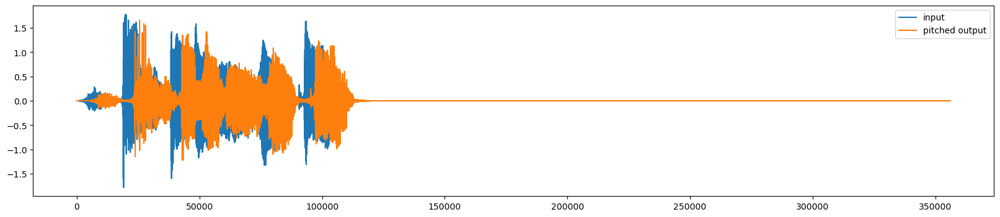

In [19]:
plt.plot(s, label='input')
plt.plot(r, label='pitched output') 
plt.legend()

Let's use the DelayLine implementation from [here](https://github.com/prandoni/modem/blob/main/statefulblocks.ipynb) : 

In [20]:
class DelayLine:
    def __init__(self, N):
        self.delay = N
        self.buffer = np.zeros(self.delay)
        
    def get(self, x):
        if np.isscalar(x):
            x = np.array([x])
        else:
            x = np.array(x)
        data = np.r_[self.buffer, x]
        y = data[:len(x)]
        if self.delay > 0:
            self.buffer = data[-self.delay:]
        return y if len(x) > 1 else y[0]

We can now realine the signals and compensate for the delay: 

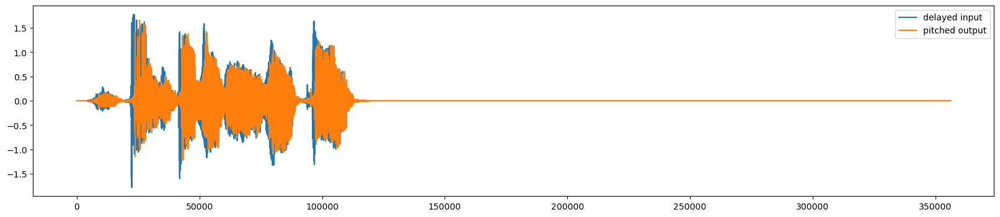

In [21]:
delay = DelayLine(grain_size)
s_d = delay.get(s)

plt.plot(s_d, label='delayed input')
plt.plot(r, label='pitched output')
plt.legend()

--------------------
### THE REVERB

To design our reverb algorithm design, we can once again take a look at some article written by Sean Costello. 

First in [this one](https://valhalladsp.com/2010/11/23/valhallashimmer-a-bit-of-history/), Sean Costello writes about his researchs around reverb design for his Shimmer : 

>*In 2006, I experimented with extending Schroeder’s early reverberator structure to much higher orders. I was expecting that using much larger numbers of cascading diffusors would increase the echo density of the algorithm. It did, but it had a really weird effect: As the number of diffusors increased, the reverb decay started to sound less and less like a “real” acoustic space, and more and more like some weird spooky backwards thing.
(...)
This wasn’t what I was expecting. More importantly, it sounded cool. Add some randomized modulation to each of the diffusors, and the result was an ethereal, ghostly soundscape.*

Schroeder reverberator reffers to the design presented by M.R Schroder in it's [1962 paper](https://hajim.rochester.edu/ece/sites/zduan/teaching/ece472/reading/Schroeder_1962.pdf) where he wanted to design a *"colorless artificial reverb"* algorithm to adress two mains issues that artificial reverb suffered at the time : the **echo density** (the number of echos per second) was too low compared to a real room and their **amplitude-frequency responses** were not flat. For this, he designed **all-pass reverberators** (flat frequency response). By doing this, Schroeder defined the fondations of digital reverb designs algorithms.

Starting from this, we will choose the Schroeder design where he feeds parallel *comb filters* to a serie of *all-pass filters* (we will see them more in details later) and try to add much more all-pass filters in the serie. 

<img width="300" style="float: center; margin: 20px 0px 0px 320px;" src="SCHROEDER_design3.png">

> *Schroeder's "colorless" reverb design using a series of all-pass reverberator mixed with parallel comb filters and with the dry input signal*


<img width="300" style="float: center; margin: 20px 0px 0px 320px;" src="Schroeder_design2.png">

> *Schroeder's series of all-pass reverberator*

The steps for the design of our reverb will be : 
1. Implement Schroeder's all-pass reverberators
2. Implement comb-filters
3. Implement parallel comb-filters into the serie of all-pass
4. Choose correct gain and delay parameters in our filters to get the desired results.
5. Implement the design as a stateful procssing block

##### 1. Schroeder's all-Pass reverberators 

<img width="300" style="float: center; margin: 20px 0px 20px 320px;" src="all_pass_filter.png">

A *Schroeder all-pass reverberator* $AP_i$ is defined by it's feedback gain $g_i$ and it's delay $\tau_i$.

In a digital form, the difference equation of the all-pass filter $AP_i$ is : 
> $y_{AP_i}[n] = -g_ix[n] + x[n-M_i] + g_iy[n-M_i]$
>
>  $M_i$ is the *sample delay* and can be computed from the *delay* $\tau_i$ and the sampling frequency $Fs$ ; $M_i=\tau_i*Fs/1000$

The transfer function is then : 
> $H_{AP_i}(z) = \frac{-g_i + z^{-M_i}}{1-g_iz^{-M_i}}$

The frequency response : 
> $H_{AP_i}(\omega) = \frac{e^{-i\omega M_i}-g_i}{1-g_ie^{-i\omega M_i}}$

An all-pass system is a system that does not impact any frequency of the input data. 

In fact, we can verify that $|H_{AP_i}(\omega)|$ = 1, the system is indeed all-pass

We can see that Schroeder all-pass reverberator are : 

- Stable if $|g_i| < 1$
- Causal
- An order M IIR filter

In [22]:
def allpass(input, g, delay) : 
    #compute the samples delay
    M = time_to_samples(delay)
    N = int(len(input))
    y = np.zeros(N)
    #compute the output
    for n in range(0, N-1): 
        if n < M : 
            y[n] = -g*input[n]
        else : 
            y[n] = -g*input[n] + input[int(n-M)] + g*y[int(n-M)]
    return y

Now we can test to put three of those all-pass filters in series and listen to the result. The value for the feedback gains and the delays are for now taken arbitrarely, we will see later in details how to choose those parameters correctly.

In [23]:
g = 0.7
wet_rev = s
#delay values
delays = [37,13, 5, 1.7]
for d in delays : 
    wet_rev = allpass(wet_rev, g, d)
IPython.display.Audio(wet_rev, rate=Fs)

If we mix that with the dry signal, we have a very quick, non-natural reverb.

In [24]:
#this function will be used to mix two signals together according to a given ratio
def mix(input_dry, input_wet, wet_ratio) : 
    N = int(max(len(input_dry), len(input_wet)))
    out = np.zeros(N)
    for i in range (0, N) : 
        x = input_dry[i] if i < len(input_dry) else 0 
        y = input_wet[i] if i < len(input_wet) else 0 
        out[i] = x*float((1-wet_ratio)) + y*float((wet_ratio))
    return out
        
IPython.display.Audio(mix(s, wet_rev, 0.8), rate=Fs)

Now let's add the comb filters. 

##### 2. The feedback comb filter

<img width="300" style="float: center; margin: 20px 0px 20px 320px;" src="comb_filter.png">

Like the all-pass filter, the feedback comb filter $C_i$ is defined by it's feedback gain $g_i$ and it's delay $\tau_i$.

In a digital form, the difference equation of the comb filter $C_i$ is simply: 
> $y_{C_i}[n] = x[n] +  g_iy[n-M_i]$

The transfer function is then : 
> $H_{C_i}(z) = \frac{1}{1-g_iz^{-M_i}}$

The comb filter is then also : 

- Stable if $|g_i| < 1$
- Causal
- An order M IIR filter


In [25]:
def comb(input, g, delay) : 
    #compute the samples delay
    M = time_to_samples(delay)
    N = int(len(input))
    y = np.zeros(N)
    #compute the output
    for n in range(0, N-1): 
        if n < M : 
            y[n] = input[n]
        else : 
            y[n] = input[n] + g*y[int(n-M)]
    return y

We can now implement the final Schroeder design ! 

In [26]:
#genereate a Schroeder reverb effect given the set of parameters
def reverb(input, gains_ap, delays_ap, gains_c, delays_c, mix_ratio): 
    #number of all-pass 
    N = int(len(delays_ap))
    
    reverb_wet = np.zeros(int(len(input)))
    #the 4 combs in parallel
    for i in range(0, 3): 
        reverb_wet += comb(input, gains_c[i], delays_c[i])
        
    #the all-pass in series
    for i in range(0, N-1) : 
        reverb_wet = allpass(reverb_wet, gains_ap[i], delays_ap[i])
    
    #mix the output with the input
    return mix(input, reverb_wet, mix_ratio)

##### 3. Set the parameters 

By looking at the impulse response of a reverberation algorithm, we can define few parameters. 
<img width="300" style="float: center; margin: 20px 0px 20px 320px;" src="impulse_resp.png">

- Decay time, defined as the time in which the reverberating level decays by 60dB.
- The decay rate, as the time rate at which the level decreases. The unit is decibel per second (dB/s).
- The pre-delay, the time between the direct sound and the first reflection. 
- The echo-density, the density at which reflections occurs.
- etc...

In the ValhallaShimmer plugin we have only few parameters to controls the reverb. 

- The diffusion
- The size
- Modulation

In fact, the reverb algorithm inside the shimmer should be a very spacy, strange, long reverb and it's not really built to represent a real acoustic space. So in our implementation, we don't have to really care about pre-delay or "realistic" decay rate, etc... 

We will the only focus on those two parameters : 

- The **diffusion** parameters often relies on the echo-density, as bigger diffusion means a more complex accoustic space. We can then choose to map the diffusion parameter to the number of in serie all-pass filters. As this number increases, we should hear strange metallic artifacts but those are wanted to sound like the shimmer. (see this [blog](https://valhalladsp.com/2011/01/21/reverbs-diffusion-allpass-delays-and-metallic-artifacts/) for more informations). 

- The **size** parameters means to represent the size of the artificial room. Intuitively, a small size means that echo are very shorts and inversely. We should except that the size parameters controls the delays and gains parameters of our filters. 


> Something we really need to care of is the fact that, to have a flutter free reverb (no hearing of distincts echos), we need to keep an echo density of minimum 1000 echos/s. This result come from psycho-acousticals experiments as you can see on [Schroeder's paper](https://hajim.rochester.edu/ece/sites/zduan/teaching/ece472/reading/Schroeder_1962.pdf). So we will need to keep a minimal amount of all-passes in order to create enough echos. 
>
> Moreover, the delays parameters must all be co-primes, as we don't want to cause annulation and amplification between the echos 



  

First let's implement an utilitary fonction that draw the impulse response of our reverb given a set of parameters, it will help use to shape the reverb : 

In [27]:
#plot the impulse response given a set of parameters
def impulse_resp_rev(gains_ap, delays_ap, gains_c, delays_c) : 
    impulse = np.zeros(441000)
    impulse[0] = 1
    impulse_resp = reverb(impulse, gains_ap, delays_ap, gains_c, delays_c, 1)
    print("The impulse response on 441'000 samples (10s with our sample rate) :")
    plt.plot(impulse_resp)
    plt.show()

We can now make a first test with arbitrary delays parameters. 

The impulse response on 441'000 samples (10s with our sample rate) :


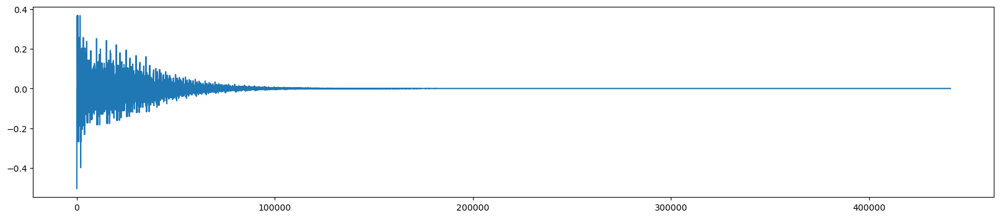

In [28]:
gains_ap = [0.7, 0.7, 0.7, 0.7, 0.7]
delays_ap = [113, 37,13,7, 5, 1.7]
gains_c = [0.773, 0.802, 0.753, 0.733]
delays_c = [113, 127, 153, 151]

impulse_resp_rev(gains_ap, delays_ap, gains_c, delays_c)
IPython.display.Audio(reverb(s, gains_ap, delays_ap, gains_c, delays_c, 0.8), rate=Fs)

We already have pretty decent results with those parameters. Now, let's try to add more all-pass filters. The gain factors stays the same and the delays are prime numers between 113 and 2 : 

The impulse response on 441'000 samples (10s with our sample rate) :


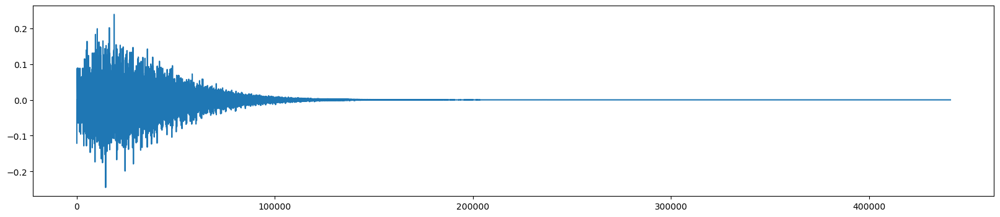

In [29]:
gains_ap = [0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7, 0.7]
delays_ap = [113, 97, 73, 67, 37, 23, 13,7, 5, 2]
gains_c = [0.773, 0.802, 0.753, 0.733]
delays_c = [113, 127, 153, 151]

impulse_resp_rev(gains_ap, delays_ap, gains_c, delays_c)
IPython.display.Audio(reverb(s, gains_ap, delays_ap, gains_c, delays_c, 0.2), rate=Fs)

We see that we have a much more echo-dense reverb and we begin to hear some strange metallic artifacts. 

Now we can try to increase the delays and the gains factor of the combs filters slightly : 

The impulse response on 441'000 samples (10s with our sample rate) :


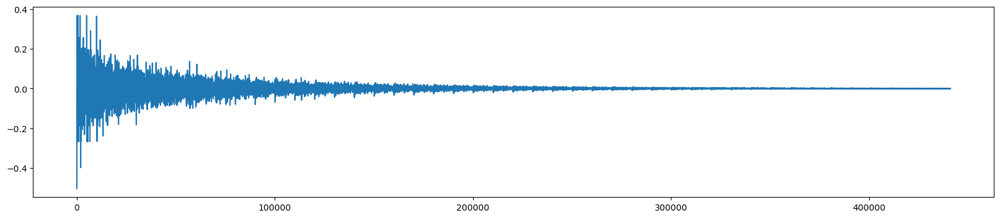

In [30]:
gains_ap = [0.7, 0.7, 0.7, 0.7, 0.7]
delays_ap = [113, 37,13,7, 5, 1.7]
gains_c = [0.873, 0.902, 0.853, 0.833]
delays_c = [213, 227, 253, 251]

impulse_resp_rev(gains_ap, delays_ap, gains_c, delays_c)
IPython.display.Audio(reverb(s, gains_ap, delays_ap, gains_c, delays_c, 0.2), rate=Fs)

We have a much more longer reverb, and indeed, it's size sounds bigger. We have then our receipe to choose our parameters given the **size** and the **diffusion** ! 
> As said earlier, we can add modulation on the filters parameters to obtain better results, but we choose not to add them for simplicity 

In [31]:
#Those variables are the "template" of the parameters, they were found by subjectives tests
primes =  [2,3,5,7,11,13,17,19,23,29,31,37,41,43,47,53,59,61,67,71,73,79,83,89,97,101,103,107,109,113]
min_ap = 3
max_ap = 9
basic_gain_ap = 0.7
basic_gains_c = [0.773, 0.802, 0.753, 0.733]
basic_delays_c = [113.2, 127.3, 153.5, 151.7]
max_shift_gain_c = 0.1
max_shift_delay_c = 100.0
N_c = len(basic_gains_c)

#compute the gains and delays parameters given size and diffusion
def par_rev(size, diffusion) : 
    #size should be between 0 and 1 
    if(size > 1.0) : size = 1.0
    if(size < 0.0) : size = 0.0
    #diffusion is between 0 and 10
    if(diffusion > 10.0) : size = 10.0
    if(diffusion < 0.0) : size = 0.0
        
    #diffusion (The min number of all-pas is min_ap, the max number of all-pass is max_ap) : 
    N_ap = min_ap + int(np.floor((max_ap-min_ap)*diffusion/10))
    #choose the all-pass delays parameters (we take N_ap primes number between 2 and 113 as equi-distant from each other as possible)
    shift = int(np.floor(len(primes)/N_ap))
    g_ap = np.zeros(N_ap)
    d_ap = np.zeros(N_ap)
    for i in range(0, N_ap): 
        g_ap[i] = basic_gain_ap
        d_ap[i] = primes[i*shift]
        
    #the size (it shift the delays and parameters of the comb filters slightly) 
    shift_gain = size*max_shift_gain_c
    shift_delay = size*max_shift_delay_c
    g_c = np.zeros(N_c)
    d_c = np.zeros(N_c)
    for i in range(0, N_c):
        g_c[i] = basic_gains_c[i] + shift_gain
        d_c[i] = basic_delays_c[i] + shift_delay
    return(g_ap, d_ap, g_c, d_c)

We can try to shape our reverb using the two parameters and listen to the resulting impulse response !

In [32]:
from ipywidgets import interact, widgets
from IPython.display import display, Audio

#widgets to controls the parameters
button = widgets.Button(description="Generate")
diffusion_widget = widgets.FloatSlider(min = 0, max = 10, value = 0, step=0.1, description="Diffusion :")
size_widget = widgets.FloatSlider(min = 0, max = 1, value = 0, step=0.01, description="Size :")
wet_widget = widgets.FloatSlider(min = 0, max = 1, value = 0, step=0.01, description="Dry/Wet :")
output = widgets.Output()


def on_button_clicked(b):
    with output:
        output.clear_output()
        par = par_rev(size_widget.value, diffusion_widget.value)
        #show parameters 
        print(f"- Gains All-pass = {par[0]}. \n- Delays All-pass = {par[1]}. \n- Gains combs = {par[2]}. \n- Delays combs = {par[3]}. \n ")
        #display the audio result
        display(Audio(reverb(s, par[0], par[1], par[2], par[3], wet_widget.value), rate=Fs))
        #show impulse response 
        impulse_resp_rev(par[0], par[1], par[2], par[3])
    
#assign the button to the handler and display the widgets
button.on_click(on_button_clicked)
display(button, size_widget, diffusion_widget, wet_widget, output)      

Button(description='Generate', style=ButtonStyle())

FloatSlider(value=0.0, description='Size :', max=1.0, step=0.01)

FloatSlider(value=0.0, description='Diffusion :', max=10.0)

FloatSlider(value=0.0, description='Dry/Wet :', max=1.0, step=0.01)

Output()

##### 4. Build it as a stateful processing block 

The following class taken from [here](https://github.com/prandoni/modem/blob/main/statefulblocks.ipynb) constructs a stateful processing block representing a IIR filter with difference equation

$$
    y[n] = \sum_{k=0}^{N-1} b_k x[n-k] - \sum_{k=1}^{M-1} a_k y[n-k].
$$ 
It is assumed that $a_0 
= 1$.

In [33]:
class IIR:
    def __init__(self, B, A):
        # flip coefficients
        self.a = np.array(A)[:0:-1] # skip a_0, which we assume to be 1
        self.M = len(A) - 1
        self.ybuf = np.zeros(self.M)
        self.b = np.array(B)[::-1]
        self.N = len(B)
        self.xbuf = np.zeros(self.N - 1)

    def reset(self):
        self.xbuf = self.xbuf * 0.0
        self.ybuf = self.ybuf * 0.0

    def filter(self, x):
        if np.isscalar(x):
            x = np.array([x])
            data_len = 1
        else:
            x = np.array(x)
            data_len = len(x)
        x = np.r_[self.xbuf, x]
        y = np.r_[self.ybuf, np.zeros(data_len)]
        for n in range(0, data_len):
            y[n+self.M] = np.sum(self.b * x[n:n+self.N]) - np.sum(self.a * y[n:n+self.M])
        # update buffer on exit
        if self.N > 0:
            self.xbuf = x[-self.N:]
        self.ybuf = y[-self.M:]
        return y[self.M:] if data_len > 1 else y[self.M]

The following functions generates the difference equation coefficients of a comb or an all-pass filter : 

In [34]:
#comb filter 
def comb_coeff(delay, gain): 
    M = time_to_samples(delay)
    A = np.zeros(M+1)
    B = np.zeros(1)
    A[M] = -gain
    B[0] = 1
    return (A,B)

#all pass
def all_pass_coeff(delay, gain): 
    M = time_to_samples(delay)
    A = np.zeros(M+1)
    B = np.zeros(M+1)
    A[M] = -gain
    B[0] = -gain
    B[M] = 1
    return (A,B)

Here we have our final shchroeder reverberator processing block : 

In [35]:
class schroeder_rev_rt: 
    def __init__(self, size, diffusion, wet): 
        #generate and set all the parameters
        self.g_ap, self.d_ap, self.g_c, self.d_c = par_rev(size, diffusion)
        self.combs = []
        #the number of comb filters
        self.N_1 = len(self.g_c)
        self.aps = []
        #the number of all passes filters 
        self.N_2 = len(self.g_ap)
        self.wet = wet
        #generate combs
        for i in range(0, self.N_1) : 
            A,B = comb_coeff(self.d_c[i], self.g_c[i])
            self.combs.append(IIR(B, A))
        #generate all passes                      
        for i in range(0, self.N_2) : 
            A,B = all_pass_coeff(self.d_ap[i], self.g_ap[i])          
            self.aps.append(IIR(B, A))

    def reset(self):
        #reset all combs
        for c in self.combs : c.reset
        #reset all all passes
        for a in self.aps : a.reset
    
    def filter(self, x):
        if np.isscalar(x): x = np.array([x])
        reverb_wet = np.zeros(int(len(x)))
        #the combs in parallel
        for i in range(0, self.N_1) : reverb_wet += self.combs[i].filter(x)     
            
        #the all-pass in series
        for i in range(0, self.N_2) : reverb_wet = self.aps[i].filter(reverb_wet) 
            
        if np.isscalar(reverb_wet): reverb_wet = np.array([reverb_wet])
        #mix the output with the input
        return mix(x, reverb_wet, self.wet)

The  latter implementation can be called on an input block of any size without creating border effects ! 

--------------------
### THE FILTERS

To offer better control on the final output, we will add at the end of the chain one low-pass and one high-pass filter. 

For the design, we choosed order 4 butterworth filters. Indeed they have small phase distortion and no pass-band nor stop-band ripples. The goal here is not to be precise on the cutoff but more to smooth out some undesired frequencies. Given it's "maximaly flat" passband is perfect for this.  

>Don't hesitate to check [the Wikipedia page](https://en.wikipedia.org/wiki/Butterworth_filter) to get more informations on the butterworth filters. 

We can use the already built-in *scipy.signal* implementation to constructs our filters ! 

In [36]:
#generate a 'n' order butterworth lowpass using
def lp_butter(cutoff, order, Fs):
    #normalize the cutoff
    cutoff = cutoff/Fs/2
    b, a = sp.butter(order, cutoff, btype='lowpass', analog=False)
    return IIR(b,a)

#generate a 'n' order butterworth higpass
def hp_butter(cutoff, order, Fs):
    #normalize the cutoff
    cutoff = cutoff/Fs/2
    b, a = sp.butter(order, cutoff, btype='highpass', analog=False)
    return IIR(b,a)

Let's here the lowpass result with a cutoff frequency at $10000hz$

In [37]:
#we choosed order 4
lp = lp_butter(10000, 4, Fs)
IPython.display.Audio(lp.filter(s), rate=Fs)

And now the highpass result with a cutoff at $5000hz$

In [38]:
#we choosed order 4
hp = hp_butter(5000, 4, Fs)
IPython.display.Audio(hp.filter(s), rate=Fs)

--------------------
### PUTTING ALL TOGETHER

Now that we have the pitch-shifter, the reverberator and the filters. We just have to use all of those blocks to create our shimmer ! 

For a reminder the design was : 

<img width="800" style="float: center; margin: 10px 10px 30px 85px;" src="ShimmerReverbDesign_3.png">

Because the Pitch shifter adds a lot of artifacts and can be disturbing. We choosed to not apply the pitch shift to the entire signal but on a portion of it defined by the $pitch ratio$. 

More over we will also have to compensate for the delay induced by the pitch shift by delaying the dry input by a $grainSize$ and same for the reverb output before adding it to the pitch output. 

For the feedback loop, it's implemented by adding the last generated output of the loop to the input. 




In [42]:
class shimmer: 
    def __init__(self, size, diffusion, shift, feedback, high_pass, low_pass, mix): 
        #the reverb 
        self.r = schroeder_rev_rt(size, diffusion, .6)
        #the pitch shift
        self.p = GS_pitchshift(shift_factor(shift))
        #the delay line
        self.d = DelayLine(grain_size)        
        #the lowpass
        self.lp = lp_butter(low_pass, 4, Fs) 
        #the highpass
        self.hp = hp_butter(high_pass, 4, Fs)
        #dry/wet ratio
        self.mix = mix 
        #feedback ratio
        self.feedback = feedback
        #pitch ratio
        self.pitch_ratio = .20

        #buffer for the feedback
        self.y_buf = np.zeros(1)
        

    def reset(self): 
        #reset all the components
        self.r.reset()
        self.p.reset()
        self.d.reset()
        self.lp.reset()
        self.hp.reset()
        self.y_buf = np.zeros(1)
        
    def filter(self, x): 
        if np.isscalar(x): x = np.array([x])
        data_len = len(x)
        y = np.r_[self.y_buf, np.zeros(data_len)]
        
        #the feedback loop
        for n in range(0, data_len):
            #mix feedback with input given the ratio 
            out = (1-self.feedback)*x[n] + self.feedback*y[n]
            #apply the reverb  
            out = self.r.filter(out) 
            #apply the pitch 
            pitch = self.p.filter(out)
            #mix the pitched signal and the input given the ratio (don't forget the delay block to realine the signals)
            out = (1-self.pitch_ratio)*self.d.get(out) + self.pitch_ratio * pitch
            y[n+1] = out
            
        #update buffer
        self.y_buf = y[-1:]
        #compute the final output
        output = y[1:]
        #apply lowpass
        output = self.lp.filter(output)
        #apply highpass
        output = self.hp.filter(output) 
        
        return mix(self.d.get(x), output, self.mix)  

--------------------
### RESULTS

We can now hear the final result for this notebook. Because the feedback loop demands to call the reverb and the pitch-shift one sample at a time, the running time is very slow (≈5min to generate a result for a 8s input). Given that it's very hard to optimize all the different parameters to obtain the best result. But we can already hear the main character of the shimmer, a strange pitched reverb. 

Of course to get better result, we can create a more complex version of our reverberator, maybe add modulation on the parameters, handle stereo signal etc... Indeed we only used the basic Schroeder design that can be deeply improved. Same for the pitch-shifter, lot of ameliorations exist to have better results. 

To conclude, we have a now all the ingredients to build our own real-time implementation ! Let's go with the C ! 

> A lot of high frequencies and metallic artifacts are generated during the process, don't hesitate to use the lowpass filter to get more pleasant results !


In [40]:
#widgets to controls the parameters
button_gen_shim = widgets.Button(description="Generate")
diffusion_widget_shim = widgets.FloatSlider(min = 0, max = 10, value = 0, step=0.1, description="Diffusion :")
size_widget_shim = widgets.FloatSlider(min = 0, max = 1, value = 0, step=0.01, description="Size :")
shift_widget_shim = widgets.FloatSlider(min = -12, max = 12, value = 0, step=1.0, description="Shift :")
feedback_widget_shim = widgets.FloatSlider(min = 0, max = 0.1, value = 0, step=0.01, description="Feedback :")
lowpass_widget_shim = widgets.FloatSlider(min = 12000, max = 24000, value = 24000, step=10.0, description="lowpass :")
highpass_widget_shim = widgets.FloatSlider(min = 1, max = 11000, value = 1, step=10.0, description="highpass :")
mix_widget_shim = widgets.FloatSlider(min = 0, max = 1, value = 0, step=0.01, description="Dry/Wet :")
output_shim = widgets.Output()

#generate the result given the input parameters
def generate_shim(b):
    #create the shimmer 
    shim = shimmer(size_widget_shim.value, diffusion_widget_shim.value, shift_widget_shim.value, feedback_widget_shim.value, highpass_widget_shim.value, lowpass_widget_shim.value, mix_widget_shim.value)
    #the result output
    result = shim.filter(s)   
    with output_shim:
        output_shim.clear_output()
        #display the audio result
        display(Audio(result, rate=Fs))
        #save the output in an audio file
        wavfile.write("output_shimmer.wav", Fs, result.astype(np.float32))
        print("Result saved in .\output_shimmer.wav !")
        
#assign the button to the handler and display the widgets
button_gen_shim.on_click(generate_shim)
display(button_gen_shim, size_widget_shim, diffusion_widget_shim, shift_widget_shim, feedback_widget_shim, lowpass_widget_shim, highpass_widget_shim, mix_widget_shim,  output_shim)      

Button(description='Generate', style=ButtonStyle())

FloatSlider(value=0.0, description='Size :', max=1.0, step=0.01)

FloatSlider(value=0.0, description='Diffusion :', max=10.0)

FloatSlider(value=0.0, description='Shift :', max=12.0, min=-12.0, step=1.0)

FloatSlider(value=0.0, description='Feedback :', max=0.1, step=0.01)

FloatSlider(value=24000.0, description='lowpass :', max=24000.0, min=12000.0, step=10.0)

FloatSlider(value=1.0, description='highpass :', max=11000.0, min=1.0, step=10.0)

FloatSlider(value=0.0, description='Dry/Wet :', max=1.0, step=0.01)

Output()

In the case where you don't want to wait 5 minutes to generate your own result, you can fin a pre-computed version under ".\output_shimmer.wav"

In [41]:
IPython.display.Audio(wavfile.read('output_shimmer.wav')[1], rate=Fs)